In [2]:
import os
import cv2
import pickle
import shutil
import string
import mediapipe as mp
import pandas as pd
import tensorflow as tf
import numpy as np
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import Dense
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.decomposition import PCA
from IPython.display import Audio

In [6]:
DATA_DIR = './data'
if not os.path.exists(DATA_DIR):
    os.makedirs(DATA_DIR)
number_of_classes = 3
dataset_size = 100
cap = cv2.VideoCapture(0)
for j in range(number_of_classes):
    if not os.path.exists(os.path.join(DATA_DIR, str(j))):
        os.makedirs(os.path.join(DATA_DIR, str(j)))
    print('Collecting data for class {}'.format(j))
    done = False
    while True:
        ret, frame = cap.read()
        cv2.putText(frame, 'Ready? Press "Q" ! :)', (100, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.3, (0, 255, 0), 3,
                    cv2.LINE_AA)
        cv2.imshow('frame', frame)
        if cv2.waitKey(25) == ord('q'):
            break
    counter = 0
    while counter < dataset_size:
        ret, frame = cap.read()
        cv2.imshow('frame', frame)
        cv2.waitKey(25)
        cv2.imwrite(os.path.join(DATA_DIR, str(j), '{}.jpg'.format(counter)), frame)
        counter += 1
cap.release()
cv2.destroyAllWindows()

In [202]:
# Define paths
data_path = './data'
data1_path = './data1'

# List of folders (A, B, C, ..., Z)
folders = [chr(i) for i in range(ord('A'), ord('Z')+1)]

# Iterate through folders
for folder in folders:
    # Create paths for source and destination folders
    source_folder = os.path.join(data1_path, folder)
    destination_folder = os.path.join(data_path, folder)

    # Iterate through images in source folder
    for i in range(100, 200):
        source_image_path = os.path.join(source_folder, f'{i-100}.jpg')
        destination_image_path = os.path.join(destination_folder, f'{i}.jpg')

        # Copy the image
        shutil.copy(source_image_path, destination_image_path)


C:\Users\rajes\AppData\Local\Temp\ipykernel_9880\132452345.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


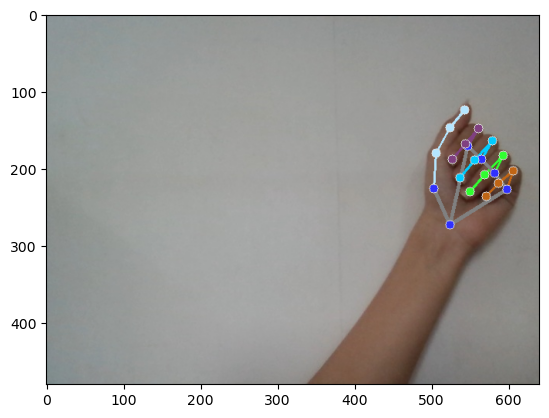

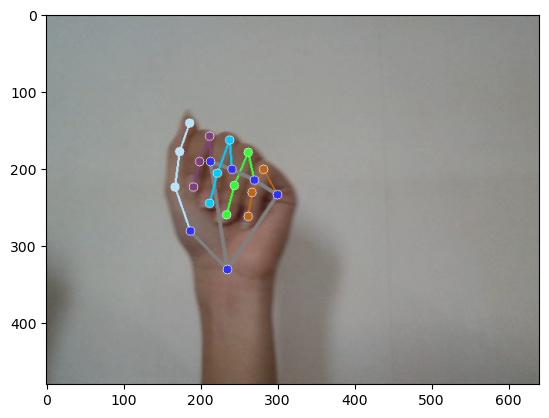

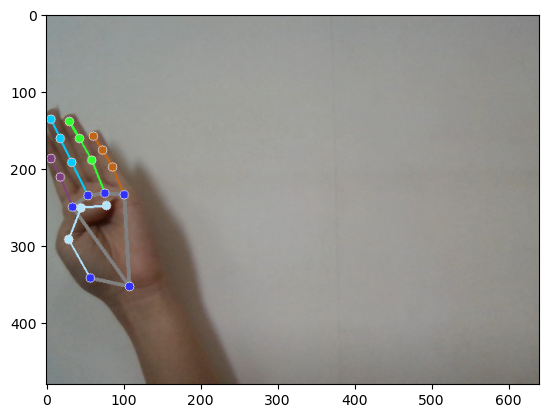

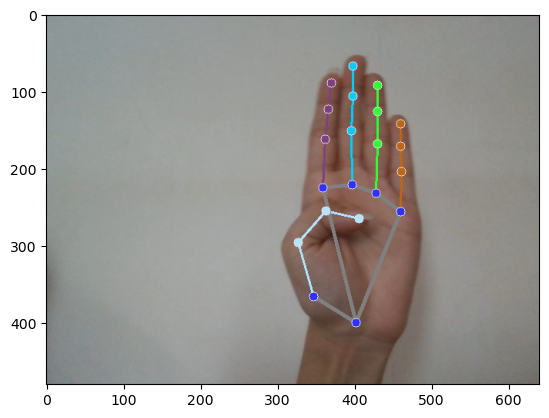

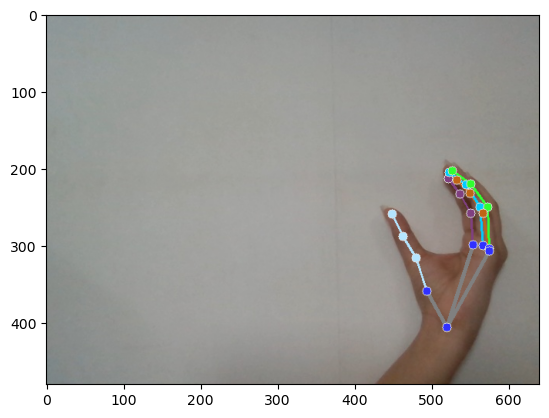

...

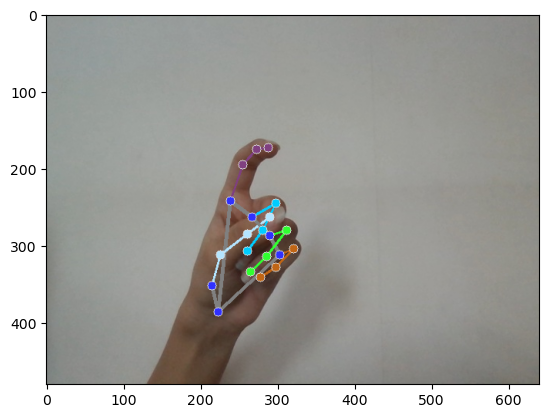

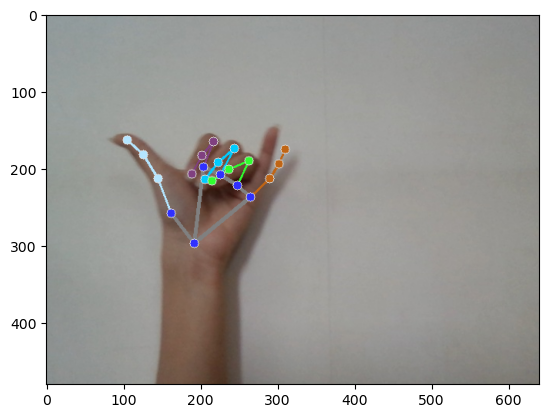

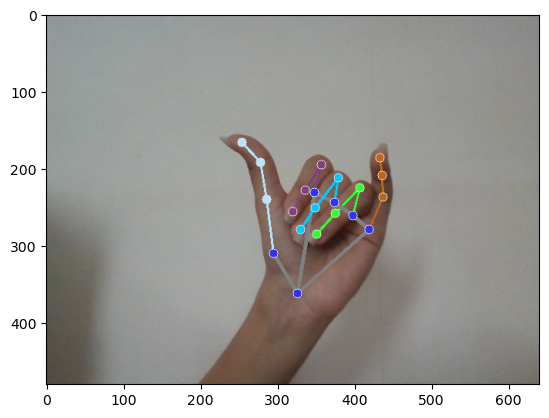

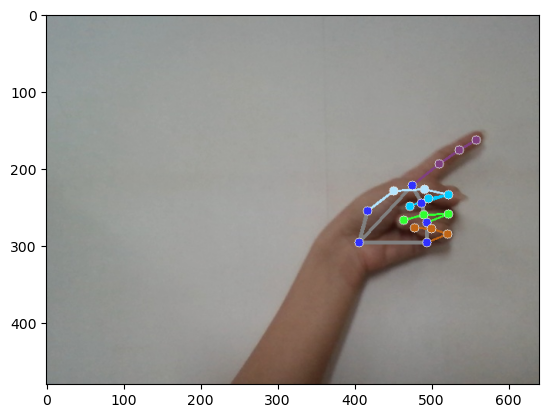

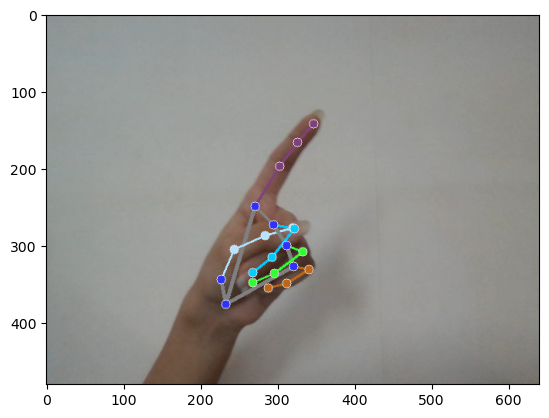

In [1]:
mp_hands = mp.solutions.hands
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles
hands = mp_hands.Hands(static_image_mode=True, min_detection_confidence=0.3)
DATA_DIR = './data'
h = 0
for dir_ in os.listdir(DATA_DIR):
    for img_path in os.listdir(os.path.join(DATA_DIR, dir_)):
        data_aux = []
        h += 1
        x_ = []
        y_ = []
        img = cv2.imread(os.path.join(DATA_DIR, dir_, img_path))
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        results = hands.process(img_rgb)
        if results.multi_hand_landmarks:
            for hand_landmarks in results.multi_hand_landmarks:
                mp_drawing.draw_landmarks(
                    img_rgb,
                    hand_landmarks,
                    mp_hands.HAND_CONNECTIONS,
                    mp_drawing_styles.get_default_hand_landmarks_style(),
                    mp_drawing_styles.get_default_hand_connections_style())
        if h%99 == 0:        
            plt.figure()
            plt.imshow(img_rgb)
plt.show()   

In [7]:
data = []
labels = []
for dir_ in os.listdir(DATA_DIR):
    for img_path in os.listdir(os.path.join(DATA_DIR, dir_)):
        data_aux = []
        x_ = []
        y_ = []
        img = cv2.imread(os.path.join(DATA_DIR, dir_, img_path))
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        results = hands.process(img_rgb)
        if results.multi_hand_landmarks:
            for hand_landmarks in results.multi_hand_landmarks:
                for i in range(len(hand_landmarks.landmark)):
                    x = hand_landmarks.landmark[i].x
                    y = hand_landmarks.landmark[i].y

                    x_.append(x)
                    y_.append(y)

                for i in range(len(hand_landmarks.landmark)):
                    x = hand_landmarks.landmark[i].x
                    y = hand_landmarks.landmark[i].y
                    data_aux.append(x - min(x_))
                    data_aux.append(y - min(y_))

            data.append(data_aux)
            labels.append(dir_)

f = open('data.pickle', 'wb')
pickle.dump({'data': data, 'labels': labels}, f)
f.close()

In [3]:
#Loading The Pickle File
with open('data.pickle', 'rb') as f:
    data_dict = pickle.load(f)
#Creating a DataFrame
df = pd.DataFrame(data_dict['data'])
df['label'] = data_dict['labels']

In [4]:
labels = df['label']

In [5]:
df

,0,1,2,3,4,5,6,7,8,9,...,33,34,35,36,37,38,39,40,41,label
0,0.087924,0.433610,0.019533,0.314140,0.000000,0.179781,0.017456,0.076801,0.047413,0.000000,...,0.290530,0.216179,0.244025,0.195003,0.178639,0.160442,0.246681,0.142892,0.306580,A
1,0.086966,0.431264,0.019076,0.313773,0.000000,0.180013,0.017092,0.077081,0.046086,0.000000,...,0.290395,0.216462,0.243456,0.194793,0.177605,0.160172,0.245436,0.142463,0.305351,A
2,0.085724,0.437008,0.018185,0.314316,0.000000,0.179242,0.017736,0.076172,0.047742,0.000000,...,0.292871,0.216217,0.247882,0.196205,0.181136,0.160811,0.248383,0.143059,0.308421,A
3,0.179399,0.220426,0.096875,0.188579,0.042360,0.123657,0.018139,0.055903,0.000000,0.000000,...,0.133276,0.191604,0.041094,0.153234,0.003002,0.155865,0.055887,0.169210,0.100106,A
4,0.179345,0.222440,0.096737,0.190244,0.041844,0.125783,0.016962,0.057081,0.000000,0.000000,...,0.134787,0.191707,0.042813,0.152939,0.004393,0.155276,0.057370,0.168996,0.102126,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5195,0.004845,0.570587,0.000000,0.491473,0.033912,0.399614,0.109457,0.355623,0.180469,0.331733,...,0.499988,0.165264,0.457103,0.202832,0.461794,0.149934,0.509984,0.106574,0.525871,Z
5196,0.004521,0.566508,0.000000,0.487187,0.033660,0.395313,0.108832,0.352753,0.179043,0.328501,...,0.497933,0.163034,0.456397,0.200243,0.463192,0.146923,0.508810,0.104481,0.522552,Z
5197,0.004700,0.561170,0.000000,0.482680,0.033781,0.390998,0.109625,0.348955,0.179451,0.324990,...,0.491479,0.161379,0.453225,0.199564,0.455433,0.147210,0.500343,0.104909,0.514540,Z
5198,0.002202,0.552620,0.000000,0.471654,0.033950,0.380816,0.106551,0.337149,0.175340,0.315666,...,0.482111,0.159788,0.442737,0.196681,0.445410,0.145211,0.488732,0.102768,0.503810,Z


In [6]:
x = df.drop(['label'],axis = 1)
label = np.array(df['label'])

In [7]:
print(x.shape)
label = label.reshape(5200,1)
print(label.shape)

(5200, 42)
(5200, 1)


In [8]:
label_to_int = {label: idx for idx, label in enumerate(np.unique(labels))}
int_labels = np.array([label_to_int[label] for label in labels])

In [9]:
int_labels

array([ 0,  0,  0, ..., 25, 25, 25])

In [10]:
X_train, X_test, Y_train, Y_test = train_test_split(x,int_labels,test_size = 0.2,random_state = 1)

In [11]:
Y_train = to_categorical(Y_train)
Y_test = to_categorical(Y_test)

In [12]:
print(Y_train.shape)
print(Y_test.shape)

(4160, 26)
(1040, 26)


In [13]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='accuracy',  # The metric to monitor for improvement
    patience=5,           # Number of epochs with no improvement before stopping
    restore_best_weights=True  # Restore the best weights when stopping
)

In [14]:
modelfinal = Sequential()
modelfinal.add(Dense(512,activation = 'relu',input_shape=(42,)))
modelfinal.add(Dense(26,activation='softmax'))

In [15]:
modelfinal.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 512)               22016     
                                                                 
 dense_1 (Dense)             (None, 26)                13338     
                                                                 
Total params: 35354 (138.10 KB)
Trainable params: 35354 (138.10 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [16]:
modelfinal.compile(loss="categorical_crossentropy",optimizer = 'rmsprop', metrics = ['accuracy'])

In [17]:
history_X=modelfinal.fit(X_train,Y_train,epochs = 100,callbacks = [early_stopping])

Epoch 1/100
130/130 [==============================] - 1s 2ms/step - loss: 2.5705 - accuracy: 0.4219
Epoch 2/100
130/130 [==============================] - 0s 2ms/step - loss: 1.4506 - accuracy: 0.7428
Epoch 3/100
130/130 [==============================] - 0s 2ms/step - loss: 0.8824 - accuracy: 0.8481
Epoch 4/100
130/130 [==============================] - 0s 2ms/step - loss: 0.5962 - accuracy: 0.8947
Epoch 5/100
130/130 [==============================] - 0s 2ms/step - loss: 0.4348 - accuracy: 0.9163
Epoch 6/100
130/130 [==============================] - 0s 2ms/step - loss: 0.3329 - accuracy: 0.9365
Epoch 7/100
130/130 [==============================] - 0s 2ms/step - loss: 0.2674 - accuracy: 0.9457
Epoch 8/100
130/130 [==============================] - 0s 2ms/step - loss: 0.2172 - accuracy: 0.9558
Epoch 9/100
130/130 [==============================] - 0s 2ms/step - loss: 0.1866 - accuracy: 0.9625
Epoch 10/100
130/130 [==============================] - 0s 2ms/step - loss: 0.1631 - accura

In [18]:
modelfinal.evaluate(X_test,Y_test)

33/33 [==============================] - 0s 2ms/step - loss: 0.0157 - accuracy: 0.9952


[0.015655718743801117, 0.995192289352417]

In [19]:
lda = LDA(n_components=25)
k = lda.fit(x,int_labels)
X_lda = lda.transform(x)
predict = lda.predict(x)

In [20]:
cm=confusion_matrix(int_labels,predict)
print(cm)
print('accuracy:'+str(accuracy_score(int_labels,predict)))

[[200   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0 200   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   0 200   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   0   0 200   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   0   0   0 200   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   0   0   0   0 200   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0 200   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0 200   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0 200   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   0   0   0  

In [21]:
sc = StandardScaler()
x1 = sc.fit_transform(x)

In [22]:
pca = PCA(.95)
p = pca.fit_transform(x1)
p.shape

(5200, 9)

In [23]:
X_train, X_test, Y_train, Y_test = train_test_split(p,int_labels,test_size = 0.2,random_state = 1)

In [24]:
Y_train = to_categorical(Y_train)
Y_test = to_categorical(Y_test)

In [25]:
model = Sequential()
model.add(Dense(512,activation = 'relu',input_shape=(9,)))
model.add(Dense(26,activation='softmax'))
model.compile(loss="categorical_crossentropy",optimizer = 'rmsprop', metrics = ['accuracy'])

In [26]:
history_X=model.fit(X_train,Y_train,epochs = 100, callbacks= [early_stopping])

Epoch 1/100
130/130 [==============================] - 1s 3ms/step - loss: 0.9478 - accuracy: 0.8142
Epoch 2/100
130/130 [==============================] - 0s 2ms/step - loss: 0.2284 - accuracy: 0.9433
Epoch 3/100
130/130 [==============================] - 0s 2ms/step - loss: 0.1288 - accuracy: 0.9587
Epoch 4/100
130/130 [==============================] - 0s 2ms/step - loss: 0.0916 - accuracy: 0.9695
Epoch 5/100
130/130 [==============================] - 0s 2ms/step - loss: 0.0722 - accuracy: 0.9779
Epoch 6/100
130/130 [==============================] - 0s 2ms/step - loss: 0.0573 - accuracy: 0.9832
Epoch 7/100
130/130 [==============================] - 0s 2ms/step - loss: 0.0483 - accuracy: 0.9844
Epoch 8/100
130/130 [==============================] - 0s 2ms/step - loss: 0.0413 - accuracy: 0.9880
Epoch 9/100
130/130 [==============================] - 0s 3ms/step - loss: 0.0365 - accuracy: 0.9894
Epoch 10/100
130/130 [==============================] - 0s 2ms/step - loss: 0.0317 - accura

In [27]:
model.evaluate(X_test,Y_test)

33/33 [==============================] - 0s 1ms/step - loss: 0.0065 - accuracy: 0.9971


[0.006454385817050934, 0.9971153736114502]

In [28]:
lda = LDA(n_components=8)
k = lda.fit(p,int_labels)
X_lda = lda.transform(p)
predict = lda.predict(p)

In [29]:
cm=confusion_matrix(int_labels,predict)
print(cm)
print('accuracy:'+str(accuracy_score(int_labels,predict)))

[[137   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0  63   0   0   0   0   0   0]
 [  0 200   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   0 192   0   0   0   0   0   0   0   0   0   0   0   8   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   0   0 142   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0  41   0  17]
 [  0   0   0   0 195   0   0   0   0   0   0   0   0   0   0   0   0   0
    5   0   0   0   0   0   0   0]
 [  0   0   0   0   0 200   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0 200   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0 200   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   0   0   0  22   0   0   0 178   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   0   0   0  

In [30]:
def ProcessData(name,classes):
    DATA_DIR = f"./{name}"
    if os.path.exists(DATA_DIR):
        print("Please pick another name")
    else:
        os.makedirs(DATA_DIR)
    number_of_classes = classes
    dataset_size = 100
    cap = cv2.VideoCapture(0)
    for j in range(number_of_classes):
        if not os.path.exists(os.path.join(DATA_DIR, str(j))):
            os.makedirs(os.path.join(DATA_DIR, str(j)))
        print('Collecting data for class {}'.format(j))
        done = False
        while True:
            ret, frame = cap.read()
            cv2.putText(frame, 'Press "c" to capture:)', (100, 50), cv2.FONT_HERSHEY_PLAIN, 1.3, (255, 0, 0), 3,
                        cv2.LINE_AA)
            cv2.imshow('frame', frame)
            if cv2.waitKey(25) == ord('c'):
                break
        counter = 0
        while counter < dataset_size:
            ret, frame = cap.read()
            cv2.imshow('frame', frame)
            cv2.waitKey(25)
            cv2.imwrite(os.path.join(DATA_DIR, str(j), '{}.jpg'.format(counter)), frame)
            counter += 1
    cap.release()
    cv2.destroyAllWindows()
    mp_hands = mp.solutions.hands
    mp_drawing = mp.solutions.drawing_utils
    mp_drawing_styles = mp.solutions.drawing_styles
    hands = mp_hands.Hands(static_image_mode=True, min_detection_confidence=0.3)
    data = []
    labels = []
    for dir_ in os.listdir(DATA_DIR):
        for img_path in os.listdir(os.path.join(DATA_DIR, dir_)):
            data_aux = []
            x_ = []
            y_ = []
            img = cv2.imread(os.path.join(DATA_DIR, dir_, img_path))
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            results = hands.process(img_rgb)
            if results.multi_hand_landmarks:
                for hand_landmarks in results.multi_hand_landmarks:
                    for i in range(len(hand_landmarks.landmark)):
                        x = hand_landmarks.landmark[i].x
                        y = hand_landmarks.landmark[i].y
                        x_.append(x)
                        y_.append(y)
                    for i in range(len(hand_landmarks.landmark)):
                        x = hand_landmarks.landmark[i].x
                        y = hand_landmarks.landmark[i].y
                        data_aux.append(x - min(x_))
                        data_aux.append(y - min(y_))
                data.append(data_aux)
                labels.append(dir_)
    dictionary = {'data': data, 'labels': labels}
    return dictionary

In [42]:
import time
def soundlanguage(data):
    for i in range(len(data)):
        link = f'./sound/8d82b5_Letter_{data[i]}_Sound_Effect.mp3'
        display(Audio(filename=link, autoplay=True))

In [41]:
def LiveTranslator(model):
    pred = [0]
    pred1 = []
    mp_hands = mp.solutions.hands
    mp_drawing = mp.solutions.drawing_utils
    mp_drawing_styles = mp.solutions.drawing_styles
    hands = mp_hands.Hands(static_image_mode=True, min_detection_confidence=0.3)
    dataset_size = 1
    cap = cv2.VideoCapture(0)
    n = 0
    while n<1:
        while True:
            counter = 0
            ret, frame = cap.read()
            if counter==0:
                cv2.putText(frame, f'Press "c" to capture, q to exit:) Predicted:{pred1}', (120, 50), cv2.FONT_HERSHEY_PLAIN, 1.3, (255, 255, 255), 3,
                        cv2.LINE_AA)
            else:
                cv2.putText(frame, f'Press "c" to capture, q to exit:) Predicted:{pred1[-1]}', (120, 50), cv2.FONT_HERSHEY_PLAIN, 1.3, (255, 255, 255), 3,
                        cv2.LINE_AA)
            cv2.imshow('frame',frame)
            if cv2.waitKey(25) == ord('q'):
                n = 2
                counter = 2
                break
                
            if cv2.waitKey(25) == ord('c'):
                break
        while counter < dataset_size:
            data = []
            data_aux = []
            x_ = []
            y_ = []
            ret, frame = cap.read()
            img_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            results = hands.process(img_rgb)
            if results.multi_hand_landmarks:
                for hand_landmarks in results.multi_hand_landmarks:
                    for i in range(len(hand_landmarks.landmark)):
                        x = hand_landmarks.landmark[i].x
                        y = hand_landmarks.landmark[i].y
                        x_.append(x)
                        y_.append(y)
                    for i in range(len(hand_landmarks.landmark)):
                        x = hand_landmarks.landmark[i].x
                        y = hand_landmarks.landmark[i].y
                        data_aux.append(x - min(x_))
                        data_aux.append(y - min(y_))
                data.append(data_aux)
                x = pd.DataFrame(data)
                prediction = model.predict(x)
                predicted_classes = np.argmax(prediction, axis=1)
                alphabet_list = list(string.ascii_uppercase)
                pred2 =[]
                for i in range(len(predicted_classes)):
                    pred2.append(alphabet_list[predicted_classes[i]])         
            pred1.append(pred2[0])        
            cv2.imshow('frame',frame)
            counter += 1
        cv2.imshow('frame',frame)   
    cap.release()
    cv2.destroyAllWindows()
    soundlanguage(pred1)
    return pred1

In [43]:
LiveTranslator(modelfinal)

1/1 [==============================] - 0s 27ms/step


['V']